In [1]:
from tqdm import tqdm
from torchvision import transforms
from torchsummary import summary
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import torch.optim as optim
#import albumentations as album

# Modelo Proba Unet - 2 classes

In [2]:
path_ori = r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\originals_180919\originals'
path = r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\ora_180919\Layers'
path_train_masks = os.path.join(path, 'train', 'mask')
path_train = os.path.join(path, 'train')


names_ = [f[:-25] for f in os.listdir(path_train_masks) if f.endswith('png') and 'sheet' in f]
print(len(names_))
names_.sort()


mask_nod = [ f  for f in os.listdir(path_train_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
names  = [f[:-27] for f in mask_nod ]

mask_nod = [ os.path.join(path_train_masks, f)  for f in os.listdir(path_train_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
mask_sh = [os.path.join(path_train_masks, f) for f in os.listdir(path_train_masks) if f.endswith('png') and 'sheet' in f  and  f[:-25] in names ]

image_Paths  = [os.path.join(path_train_masks, f) for f in os.listdir(path_train_masks) if (f.endswith('grayscale.png') or f.endswith('greyscale.png') )  and f[:-14] in names]
print(len(mask_nod), len(mask_sh), len(image_Paths))

mask_bck = [os.path.join(path_train_masks, f) for f in os.listdir(path_train_masks) if f.endswith('png') and 'ale._nonbck' in f  and f[:-22] in names]
#mask_bck = [os.path.join(path_train_masks, f) for f in os.listdir(path_train_masks) if f.endswith('png') and 'nonbck' in f  and f[:-12] in names]
#mask_bck = [os.path.join(path_train_masks, f) for f in os.listdir(path_train_masks) if f.endswith('png') and 'nonbck' in f]

print(len(mask_nod), len(mask_sh), len(mask_bck), len(image_Paths))
mask_bck.sort()

mask_nod.sort()
mask_sh.sort()
image_Paths.sort()

mask_Paths  = [[nod, sh]  for nod, sh in zip(mask_nod,mask_sh) ]

#mask_Paths  = [[nod, sh, bck]  for nod, sh, bck in zip(mask_nod,mask_sh,mask_bck) ]



78
76 76 76
76 76 76 76


In [3]:
# path_test_masks = os.path.join(path, 'test', 'mask')
# path_test = os.path.join(path, 'test')

# names_ = [f[:-25] for f in os.listdir(path_test_masks) if f.endswith('png') and 'sheet' in f]
# print(len(names_))
# names_.sort()


# mask_nod = [ f  for f in os.listdir(path_test_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
# names  = [f[:-27] for f in mask_nod ]

# mask_nod = [ os.path.join(path_test_masks, f)  for f in os.listdir(path_test_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
# mask_sh = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'sheet' in f  and  f[:-25] in names ]
# #mask_bck = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'ale._nonbck' in f  and f[:-22] in names]
# mask_bck = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'nonbck' in f  and f[:-22] in names]

# image_Paths  = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if (f.endswith('grayscale.png') or f.endswith('greyscale.png') )  and f[:-14] in names]
# print(len(mask_nod), len(mask_sh), len(mask_bck), len(image_Paths))
# mask_nod.sort()
# mask_sh.sort()
# mask_bck.sort()
# image_Paths.sort()



# mask_Paths  = [[nod, sh, bck]  for nod, sh, bck in zip(mask_nod,mask_sh,mask_bck) ]

In [62]:
# -*- coding: utf-8 -*-
"""
Created on Fri Jul 29 12:31:09 2022

@author: kmorales
"""
import torch
import torch.nn.functional as F
from torch.distributions import Normal, Independent, kl
from torch import nn

class UNET(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()

        self.conv1 = self.contract_block(in_channels, 32, 7, 3)
        self.conv2 = self.contract_block(32, 64, 3, 1)
        self.conv3 = self.contract_block(64, 128, 3, 1)

        self.upconv3 = self.expand_block(128, 64, 3, 1)
        self.upconv2 = self.expand_block(64*2, 32, 3, 1)
        self.upconv1 = self.expand_block(32*2, out_channels, 3, 1)

    def __call__(self, x):

        # downsampling part
        conv1 = self.conv1(x)
        conv2 = self.conv2(conv1)
        conv3 = self.conv3(conv2)

        upconv3 = self.upconv3(conv3)

        upconv2 = self.upconv2(torch.cat([upconv3, conv2], 1))
        upconv1 = self.upconv1(torch.cat([upconv2, conv1], 1))

        return upconv1

    def contract_block(self, in_channels, out_channels, kernel_size, padding):

        contract = nn.Sequential(
            torch.nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
            torch.nn.BatchNorm2d(out_channels),
            torch.nn.ReLU(),
            torch.nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
                                 )

        return contract

    def expand_block(self, in_channels, out_channels, kernel_size, padding):

        expand = nn.Sequential(torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.Conv2d(out_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.ConvTranspose2d(out_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1) 
                            )
        return expand
    
    
class Flatten(nn.Module):
    def forward(self, input):
        return input.view(input.size(0), -1)
    
    
class priori(nn.Module):
    def __init__(self, input_channels, filters, z_dim, image_shape):
        super(priori, self).__init__()
        self.input_channels = input_channels
        self.filters = filters
        self.z_dim = z_dim
        self.featureDim = filters*2 *image_shape[0]//4  #4 = kernel _size
        
        self.p_z = nn.Sequential(nn.Conv2d(input_channels , filters, kernel_size=4, stride=2, padding=1),
                                 nn.BatchNorm2d(filters),
                                 nn.ReLU(), 
                                 nn.Conv2d(filters , filters*2, kernel_size=4, stride=2, padding=1),
                                 nn.BatchNorm2d(filters*2),
                                 nn.ReLU(),
                                 Flatten())
        self.mean_pz = nn.Linear(self.featureDim, self.z_dim)
        self.lstd_pz = nn.Linear(self.featureDim, self.z_dim)
        
        def __call__(self, input):
            p_z = self.p_z(input)
            mean = self.mean_pz(p_z)
            log_std = self.lstd_pz(p_z)
            return mean, log_std
        

class variational(nn.Module):
    def __init__(self, input_channels, filters, z_dim, image_shape):
        super(variational, self).__init__()
        self.input_channels = input_channels
        self.filters = filters
        self.z_dim = z_dim
        self.featureDim = filters*4 *image_shape[0]//8 *image_shape[0]//8  #4 = kernel _size
        
        self.q_z = nn.Sequential(nn.Conv2d(2*input_channels , filters, kernel_size=4, stride=2, padding=1),
                    nn.BatchNorm2d(filters),
                    nn.ReLU(), 
                    nn.Conv2d(filters , filters*2, kernel_size=4, stride=2, padding=1),
                    nn.BatchNorm2d(filters*2),
                    nn.ReLU(),
                    nn.Conv2d(filters*2 , filters*4, kernel_size=4, stride=2, padding=1),
                    nn.BatchNorm2d(filters*4),
                    nn.ReLU(),
                    Flatten())
        
        self.mean_qz = nn.Linear(self.featureDim, self.z_dim)
        self.lstd_qz = nn.Linear(self.featureDim, self.z_dim)
        #self.z_qz =  nn.Linear(z_dim, self.featureDim)
        
        def __call__(self, input, mask):
            q_z = self.q_z(torch.cat([input, mask], 1))
            mean = self.mean_qz(p_z)
            log_std = self.lstd_qz(p_z)
            return mean, log_std
        
class f_combined(nn.Module):
    def __init__(self, input_channels, num_classes, filters, z_dim, image_shape):
        super(f_combined, self).__init__()
        self.input_channels = input_channels
        self.filters = filters
        self.z_dim = z_dim
        self.num_classes = num_classes
        
        self.channel_axis = 1
        self.spatial_axes = [2,3]
        
        
        self.layers = nn.Sequential(nn.Conv2d(self.z_dim + self.input_channels , self.input_channels, kernel_size = 1),
                                 nn.ReLU(), 
                                 nn.Conv2d(self.input_channels , self.input_channels, kernel_size = 1),
                                 nn.ReLU())
        
        self.last_layer = nn.Conv2d(self.input_channels, self.num_classes, kernel_size=1)
        
        
        
    def tile(self, a, dim, n_tile):
        """
        This function is taken form PyTorch forum and mimics the behavior of tf.tile.
        Source: https://discuss.pytorch.org/t/how-to-tile-a-tensor/13853/3
        """
        init_dim = a.size(dim)
        repeat_idx = [1] * a.dim()
        repeat_idx[dim] = n_tile
        a = a.repeat(*(repeat_idx))
        order_index = torch.LongTensor(np.concatenate([init_dim * np.arange(n_tile) + i for i in range(init_dim)])).to(device)
        return torch.index_select(a, dim, order_index)
    
    
    def __call__(self, feature_map, z):
        """
        Z is batch_sizexlatent_dim and feature_map is batch_sizexno_channelsxHxW.
        So broadcast Z to batch_sizexlatent_dimxHxW. Behavior is exactly the same as tf.tile (verified)
        """
        z = torch.unsqueeze(z,2)
        z = self.tile(z, 2, feature_map.shape[self.spatial_axes[0]])
        z = torch.unsqueeze(z,3)
        z = self.tile(z, 3, feature_map.shape[self.spatial_axes[1]])

        #Concatenate the feature map (output of the UNet) and the sample taken from the latent space
        feature_map = torch.cat((feature_map, z), dim=self.channel_axis)
        output = self.layers(feature_map)
        return self.last_layer(output)

class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()
    
    def forward(self, logits, true, eps=1e-7):
        num_classes = logits.shape[1]
        if num_classes == 1:
            true_1_hot = torch.eye(num_classes + 1)[true.squeeze(1)]
            true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
            true_1_hot_f = true_1_hot[:, 0:1, :, :]
            true_1_hot_s = true_1_hot[:, 1:2, :, :]
            true_1_hot = torch.cat([true_1_hot_s, true_1_hot_f], dim=1)
            pos_prob = torch.sigmoid(logits)
            neg_prob = 1 - pos_prob
            probas = torch.cat([pos_prob, neg_prob], dim=1)
        else:
            true_1_hot = torch.eye(num_classes)[true.squeeze(1)]
            true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
            probas = F.softmax(logits, dim=1)
        true_1_hot = true_1_hot.type(logits.type())
        dims = (0,) + tuple(range(2, true.ndimension()))
        intersection = torch.sum(probas * true_1_hot, dims)
        cardinality = torch.sum(probas + true_1_hot, dims)
        dice_loss = (2. * intersection / (cardinality + eps)).mean()
        return (1 - dice_loss)


def acc_metric(predb, yb):
    return (predb.argmax(dim=1) == yb.to(device)).float().mean()
     

class Probabilistic_UNET(nn.Module):
    def __init__(self, input_channels, num_classes, filters, z_dim, image_shape, beta):
        super(Probabilistic_UNET, self).__init__()
        self.input_channels = input_channels
        self.filters = filters
        self.z_dim = z_dim
        self.num_classes = num_classes
        self.beta = beta
        self.image_shape = image_shape
        
        self.priori = priori(self.input_channels,self.filters, self.z_dim, self.image_shape)
        self.UNET =  UNET(self.input_channels, self.num_classes)
        self.variational  =  variational(self.input_channels, self.filters, self.z_dim, self.image_shape)
        self.F = f_combined(self.input_channels, self.num_classes, self.filters, self.z_dim, self.image_shape)
        
    def __call__(self, image, mask):
        
        unet_features = self.UNET(image)
        
        mu_priori, logstd_priori = self.priori(image) 
        mu_vart, logstd_vart =  self.variational(image, mask)
        reconstruction_loss,  kl = self.elbo(mask, mu_vart, logstd_vart, unet_features,mu_priori, logstd_priori)
        
        return reconstruction_loss,  kl
        
        
    def _kld_gauss(self, mean_1, std_1, mean_2, std_2):
        kld_element =  (2 * torch.log(std_2) - 2 * torch.log(std_1) +
            (std_1.pow(2) + (mean_1 - mean_2).pow(2)) /
            std_2.pow(2) - 1)
        return    0.5 * torch.sum(kld_element)
    
    def reparameterize(z_mean, z_log_var):
        """ z ~ N(z| z_mu, z_logvar) """
        epsilon = torch.randn_like(z_mean)
        return z_mean + torch.exp(0.5*z_log_var)*epsilon

    def elbo(self, mask, mu_vart, logstd_vart, unet_features,mu_priori, logstd_priori ):
        criterion = DiceLoss()
        z_sample =  reparameterize(mu_vart, logstd_vart)
        
        reconstruction = self.F(unet_features, z_sample )
        
        reconstruction_loss = criterion(reconstruction, mask)
        
        kl = self._kld_gauss(mu_priori, torch.exp(logstd_priori), mu_vart, torch.exp(logstd_vart))
        
        return reconstruction_loss,  kl 
    
#     def _forward_unimplemented(self, *input: Any) -> None:
#         '''Trick mypy into not applying contravariance rules to inputs by defining
#         forward as a value, rather than a function.  See also
#         https://github.com/python/mypy/issues/8795
#         '''
#         raise NotImplementedError
        
        
        
        
        

In [63]:
#MODELO CON 4 CONVOLUCIONES



# from torch import nn
# class UNET(nn.Module):
#     def __init__(self, in_channels, out_channels):
#         super().__init__()

#         self.conv1 = self.contract_block(in_channels, 8, 7, 3)
#         self.conv2 = self.contract_block(8, 32, 3, 1)
#         self.conv3 = self.contract_block(32, 64, 3, 1)
#         self.conv4 = self.contract_block(64, 128, 3, 1)

#         self.upconv4 = self.expand_block(128, 64, 3, 1)
#         self.upconv3 = self.expand_block(64*2, 32, 3, 1)
#         self.upconv2 = self.expand_block(32*2, 8, 3, 1)
#         self.upconv1 = self.expand_block(8*2, out_channels, 3, 1)

#     def __call__(self, x):

#         # downsampling part
#         conv1 = self.conv1(x)
#         conv2 = self.conv2(conv1)
#         conv3 = self.conv3(conv2)
#         conv4 = self.conv4(conv3)

#         upconv4 = self.upconv4(conv4)
#         upconv3 = self.upconv3(torch.cat([upconv4, conv3], 1))
#         upconv2 = self.upconv2(torch.cat([upconv3, conv2], 1))
#         upconv1 = self.upconv1(torch.cat([upconv2, conv1], 1))

#         return upconv1

#     def contract_block(self, in_channels, out_channels, kernel_size, padding):

#         contract = nn.Sequential(
#             torch.nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
#             torch.nn.BatchNorm2d(out_channels),
#             torch.nn.ReLU(),
#             torch.nn.Conv2d(out_channels, out_channels, kernel_size=kernel_size, stride=1, padding=padding),
#             torch.nn.BatchNorm2d(out_channels),
#             torch.nn.ReLU(),
#             torch.nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
#                                  )

#         return contract

#     def expand_block(self, in_channels, out_channels, kernel_size, padding):

#         expand = nn.Sequential(torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=padding),
#                             torch.nn.BatchNorm2d(out_channels),
#                             torch.nn.ReLU(),
#                             torch.nn.Conv2d(out_channels, out_channels, kernel_size, stride=1, padding=padding),
#                             torch.nn.BatchNorm2d(out_channels),
#                             torch.nn.ReLU(),
#                             torch.nn.ConvTranspose2d(out_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1) 
#                             )
#         return expand

In [64]:
def box_image_seg_2(seg_im, error = 5):
    label = (seg_im!=0)*1
    #label = (seg_im==2)*1 + (seg_im==3)*1
    pix  = np.sum(label)
    if pix > 12:
        contours , _ = cv2.findContours(label.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        j = int(np.where([cv2.contourArea(x) for x in contours] == np.max([cv2.contourArea(x) for x in contours]))[0][0])
        x1, x2, y1, y2 = [], [], [], []
        Area = [cv2.contourArea(x) for x in contours]
        Area.sort(reverse=True)
        print(Area)
        for cntr in contours:
            x,y,w,h = cv2.boundingRect(cntr)
            x1.append(x)
            x2.append(x+w)    
            y1.append(y)
            y2.append(y+h)

        x, w = x1[j], x2[j]
        y, h  = y1[j] , y2[j]
    else:
        x  , y = 0 , 0
        h, w = seg_im.shape        
    return x,w, y , h

In [65]:
def box_image_seg(mask, img, error = 5, Area = 50):
    masks_imgs = []
    imgs = []
    label = (mask!=0)*1
    contours , _ = cv2.findContours(label.astype(np.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    idxs =  list(np.where(np.array([cv2.contourArea(x) for x in contours])>Area))[0]
    #print(idxs)
    #j = int(np.where([cv2.contourArea(x) for x in contours] == np.max([cv2.contourArea(x) for x in contours]))[0][0])
    pix  = np.sum(label)
    if pix > 12 and len(idxs)>0:   
        for idx in idxs:
            x,y,w,h = cv2.boundingRect(contours[int(idx)])
            #print(x,y,w,h)
            masks_imgs.append(mask[y-error:y+h+error,x-error:x+w+error])
            imgs.append(img[y-error:y+h+error,x-error:x+w+error])
    
    return masks_imgs, imgs

def read_image(imagePath, mask = True ):
    if mask:
        image = cv2.imread(imagePath, 0)
        image = cv2.normalize(image.astype(np.int16),  None, 0, 255, cv2.NORM_MINMAX)
        image = np.where(image == 255, 1, 0)
        #(thresh, image) = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)
    else: 
        image = cv2.imread(imagePath)    
        image = cv2.normalize(image.astype(np.int16),  None, 0, 255, cv2.NORM_MINMAX)
        image = cv2.cvtColor( np.float32(image[:,:,1]),cv2.COLOR_GRAY2RGB)/255
        
    return image

def create_mask(mask_Path, idx):
    mask_img_bi = create_binary_mask(mask_Path, idx)
    n, m  =  mask_img_bi.shape
    mask_img = np.zeros(shape=(n, m, 3))
    for i in range(3):
        mask_img[0,0, :] = 1
        mask_img[:,:, i] = (i+1)*np.where(mask_img_bi == i+1, 1, 0)
        #mask_img[ :,:, i ]  = (i+1)*(Mask[:,:,i] == 255)
        #mask_img[ image == 255 ]  = (i+1)
    return mask_img 

def create_binary_mask(mask_Path, idx):
    list_images = create_img_mask(mask_Path, idx)
    list_images.reverse()
    
    n, m = list_images[0].shape
    mask_img = np.zeros((n,m),np.int64) 
    for i, image in enumerate(list_images):
        mask_img[ image == 1 ]  = (i+1)
    return mask_img    
    

def create_img_mask(mask_Path, idx):
    list_images = []
    for imagePath in mask_Path[idx]:
        list_images.append(read_image(imagePath))
    return list_images

    
# def create_mask_box(image, mask, H, W):
#     new_image = image.copy()
#     new_mask = mask.copy()
#     x, w, y , h =  box_image_seg(mask, error = 5)  
    
#     print(x, w, y , h)
#     if not any(values<=0  for values in [x, w, y , h]):
#         if w - x >= W and h - y >= H:        
#             new_mask = mask[y:h, x:w]
#             new_image = Img[y:h, x:w, :]
#         else:
#             y_ =  (128 - (h-y))//2 + 2
#             x_ =  (128 - (w-x))//2 + 2
            
#             new_mask = mask[y:h, x:w]
#             new_image = Img[y:h, x:w, :]            
#     return new_image, new_mask 

from torch.utils.data import Dataset
import cv2
import torchvision.transforms as transforms

class SegmentationDataset(Dataset):
    def __init__(self, imagePaths, maskPaths, transforms = None, error = 20):
        # store the image and mask filepaths, and augmentation
        # transforms
        self.imagePaths = imagePaths
        self.maskPaths = maskPaths
        self.transforms = transforms
        self.error  =  error
    def __len__(self):
        return len(self.imagePaths)
    
    def __getitem__(self, idx):
        # grab the image path from the current index
        imagePath = self.imagePaths[idx]
        # load the image from disk, swap its channels from BGR to RGB,
        # and read the associated mask from disk in grayscale mode
#--------------------------------------        
#         mask = create_binary_mask(self.maskPaths, idx)
#         #mask = create_mask(self.maskPaths, idx)  
#         image = read_image(imagePath, False )
        
        
#         x,w, y , h = box_image_seg(mask)
#         mask = mask[y-error:h+error,x-error:w+error]
#         image = image[y-error:h+error,x-error:w+error]
#--------------------------------------        
        image  = self.imagePaths[idx]
        mask = self.maskPaths[idx]
        image = cv2.resize(image, (H, W), interpolation=cv2.INTER_NEAREST)
        mask = cv2.resize(mask, (H, W), interpolation=cv2.INTER_NEAREST)
        
        #image = torch.tensor(image, dtype=torch.float32).unsqueeze(dim=-1).permute(2,0,1)
        image = torch.tensor(image, dtype=torch.float32).permute(2,0,1)
        mask = torch.tensor(mask, dtype=torch.long) 
        #mask = torch.tensor(mask, dtype=torch.float32).permute(2, 0, 1) 
        
        #mask = torch.tensor(mask, dtype=torch.uint8).permute(2, 0, 1) 
        #mask = mask[:, :, None].permute(2, 0, 1)

        
        # check to see if we are applying any transformations
        if self.transforms is not None:
            # apply the transformations to both image and its mask
            image = self.transforms[0](image)
            mask = self.transforms[1](mask)
        # return a tuple of the image and its mask
        
        return image, mask

In [31]:
error = 20
Area = 100
image_list = []
mask_list = []

for idx in range(len(mask_Paths)):
    #print(idx)
    mask =  create_binary_mask(mask_Paths, idx)
    image = read_image(image_Paths[idx], False )
    masks_imgs, imgs = box_image_seg(mask, image, error, Area)
    image_list += imgs
    mask_list += masks_imgs
print('Images and masks are created')
print(len(image_list), len(mask_list))     

Images and masks are created
135 135


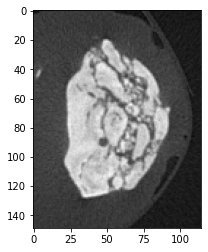

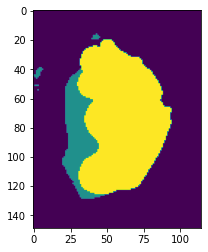

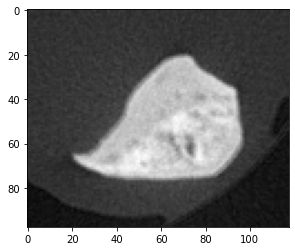

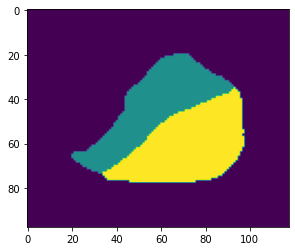

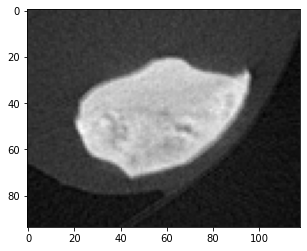

...

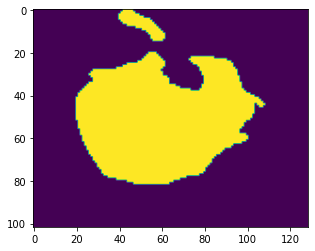

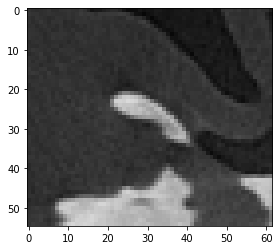

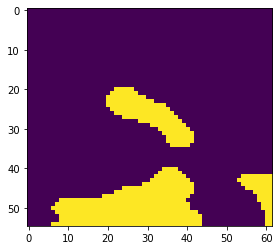

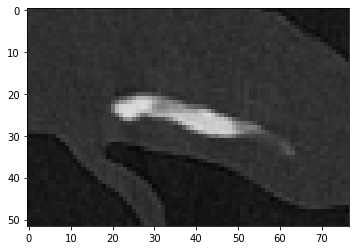

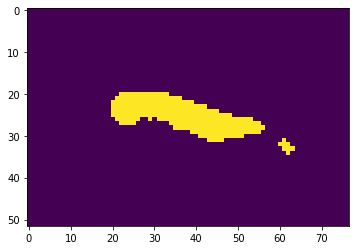

In [350]:
# for img, mask in zip(image_list, mask_list):
#     plt.imshow(img)
#     plt.show()
#     plt.imshow(mask)
#     plt.show()

In [66]:

H, W  = 1128, 128
input_channels = 3
num_classes = 3
filters = 8
z_dim = 5
image_shape = (H, W) 
beta = 10

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
modelPath = r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\model3'

epochs = 10

net = Probabilistic_UNET(input_channels, num_classes, filters, z_dim, image_shape, beta)
net.to(device)

optimizer = torch.optim.Adam(net.parameters(), lr=1e-3, weight_decay=0)

#summary(net)

data = SegmentationDataset(image_list, mask_list)
dataloaders = torch.utils.data.DataLoader(data, 2)

for index, batch in enumerate(dataloaders): 

    X, y = batch

    X, y = X.to(device), y.to(device)
    #print(X.shape, y.shape)
    
#assert getattr(nn.Module, nn.Module.forward.__name__, None).__doc__

In [67]:
for epoch in range(epochs):
    for step, batch in enumerate(dataloaders): 
        X, y = batch
        patch, mask = X.to(device), y.to(device)
        
        rec_loss,  dkl_loss =  net(patch,mask)      
        elbo =  -(rec_loss + beta * dkl_loss)
        if step % 20 == 0:
                # clear_output(wait=True)
                print('Current step: {}  Loss: {}  Recons: {}  dkl : {}'.format(step, elbo, rec_loss, dkl_loss))
                
        loss = -elbo
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

NotImplementedError: 

In [445]:
from torch.utils.data import Dataset
import cv2
import torchvision.transforms as transforms




 
import time
def train(model, dataloader, loss_fn, optimizer, acc_fn, epochs=1):
    start = time.time()
    model.to(device)

    train_loss = []

    best_acc = 0.0

    for epoch in range(epochs):
        print('Epoch {}/{}'.format(epoch, epochs - 1))
        print('-' * 10)

        model.train(True)  # Set trainind mode = true        
        
        running_loss = 0.0
        running_acc = 0.0

        step = 0

        # iterate over data
        for x, y in dataloader:
            x = x.to(device)
            y = y.to(device)
            step += 1
            
            optimizer.zero_grad()
            outputs = model(x)
            loss = loss_fn(outputs, y)

            # the backward pass frees the graph memory, so there is no 
            # need for torch.no_grad in this training pass
            loss.backward()
            optimizer.step()
            # scheduler.step()


            # stats - whatever is the phase
            acc = acc_fn(outputs, y)

            running_acc  += acc*dataloader.batch_size
            running_loss += loss*dataloader.batch_size 

            if step % 10 == 0:
                # clear_output(wait=True)
                print('Current step: {}  Loss: {}  '.format(step, loss))
                print('Current step: {}  Loss: {}  Acc: {} '.format(step, loss, acc))

                # print(torch.cuda.memory_summary())

        epoch_loss = running_loss / len(dataloader.dataset)
        epoch_acc = running_acc / len(dataloader.dataset)

        print('Loss: {:.4f} Acc: {}'.format(epoch_loss, epoch_acc))
        #print('Loss: {:.4f}'.format(epoch_loss))


        train_loss.append(epoch_loss)
        if epoch % 5 == 0: #Save model weight once every 60k steps permenant file
            print("Saving Model" +str(epoch) + ".torch")
            torch.save(model.state_dict(),   str(epoch) + ".torch")
        

    time_elapsed = time.time() - start
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))    
    
    return train_loss   

def acc_metric(predb, yb):
    return (predb.argmax(dim=1) == yb.to(device)).float().mean()



In [218]:
# mask_Paths_ = [mask_Paths[idx] for idx in idxs]
# image_Paths_ = [image_Paths[idx] for idx in idxs]
# print(len(mask_Paths_), len(image_Paths_))

61 61


In [447]:
#data = SegmentationDataset(image_Paths, mask_Paths, [transformImg,transformAnn])
#data = SegmentationDataset(image_Paths_, mask_Paths_)

data = SegmentationDataset(image_list, mask_list)
dataloaders = torch.utils.data.DataLoader(data, 2)
#data = tqdm(data_loaded)
device = 'cpu'
for index, batch in enumerate(dataloaders): 

    X, y = batch

    X, y = X.to(device), y.to(device)
    #print(X.shape, y.shape)

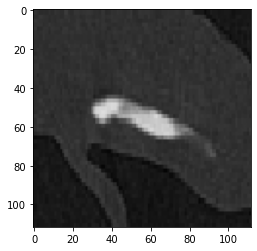

In [448]:
plt.imshow(X[0].permute(1,  2, 0).numpy())

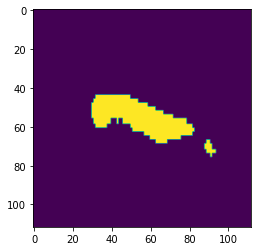

In [449]:
plt.imshow(y[0].numpy())

In [450]:
from torch.nn import functional as F


"""Computes the Sørensen–Dice loss.
Note that PyTorch optimizers minimize a loss. In this
case, we would like to maximize the dice loss so we
return the negated dice loss.
Args:
    true: a tensor of shape [B, 1, H, W].
    logits: a tensor of shape [B, C, H, W]. Corresponds to
        the raw output or logits of the model.
    eps: added to the denominator for numerical stability.
Returns:
    dice_loss: the Sørensen–Dice loss.
"""
        
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()
    
    def forward(self, logits, true, eps=1e-7):
        num_classes = logits.shape[1]
        if num_classes == 1:
            true_1_hot = torch.eye(num_classes + 1)[true.squeeze(1)]
            true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
            true_1_hot_f = true_1_hot[:, 0:1, :, :]
            true_1_hot_s = true_1_hot[:, 1:2, :, :]
            true_1_hot = torch.cat([true_1_hot_s, true_1_hot_f], dim=1)
            pos_prob = torch.sigmoid(logits)
            neg_prob = 1 - pos_prob
            probas = torch.cat([pos_prob, neg_prob], dim=1)
        else:
            true_1_hot = torch.eye(num_classes)[true.squeeze(1)]
            true_1_hot = true_1_hot.permute(0, 3, 1, 2).float()
            probas = F.softmax(logits, dim=1)
        true_1_hot = true_1_hot.type(logits.type())
        dims = (0,) + tuple(range(2, true.ndimension()))
        intersection = torch.sum(probas * true_1_hot, dims)
        cardinality = torch.sum(probas + true_1_hot, dims)
        dice_loss = (2. * intersection / (cardinality + eps)).mean()
        return (1 - dice_loss)


def acc_metric(predb, yb):
    return (predb.argmax(dim=1) == yb.to(device)).float().mean()

In [458]:
import time

def train(model, dataloader, loss_fn, optimizer, acc_fn, epochs=1):
    start = time.time()
    model.to(device)

    train_loss = []

    best_acc = 0.0

    for epoch in range(epochs):
        print('Epoch {}/{}'.format(epoch, epochs - 1))
        print('-' * 10)

        model.train(True)  # Set trainind mode = true        
        
        running_loss = 0.0
        running_acc = 0.0

        step = 0

        # iterate over data
        for x, y in dataloader:
            x = x.to(device)
            y = y.to(device)
            step += 1
            
            optimizer.zero_grad()
            outputs = model(x)
            loss = loss_fn(outputs, y)

            # the backward pass frees the graph memory, so there is no 
            # need for torch.no_grad in this training pass
            loss.backward()
            optimizer.step()
            # scheduler.step()


            # stats - whatever is the phase
            acc = acc_fn(outputs, y)

            running_acc  += acc*dataloader.batch_size
            running_loss += loss*dataloader.batch_size 

            if step % 20 == 0:
                # clear_output(wait=True)
                #print('Current step: {}  Loss: {}  '.format(step, loss))
                print('Current step: {}  Loss: {}  Acc: {} '.format(step, loss, acc))

                # print(torch.cuda.memory_summary())

        epoch_loss = running_loss / len(dataloader.dataset)
        epoch_acc = running_acc / len(dataloader.dataset)

        print('Loss: {:.4f} Acc: {}'.format(epoch_loss, epoch_acc))
        #print('Loss: {:.4f}'.format(epoch_loss))


        train_loss.append(epoch_loss)
        if epoch % 5 == 0: #Save model weight once every 60k steps permenant file
            print("Saving Model" +str(epoch) + ".torch")
            torch.save(model.state_dict(),   os.path.join(modelPath, str(epoch) + ".torch"))
        

    time_elapsed = time.time() - start
    print('Training complete in {:.0f}m {:.0f}s'.format(time_elapsed // 60, time_elapsed % 60))    
    
    return train_loss   


In [459]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = UNET(in_channels = 3, out_channels = 3).to(device)
modelPath = r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\Hugo_seg\model3'
#summary(model)

In [460]:
loss_fn  =  DiceLoss()
opt = torch.optim.Adam(model.parameters(), lr = 0.005)
epochs = 301

In [461]:
train_loss = train(model, dataloaders, loss_fn, opt, acc_metric, epochs)

Epoch 0/300
----------
Current step: 20  Loss: 0.7550040483474731  Acc: 0.7565369606018066 
Current step: 40  Loss: 0.6074290871620178  Acc: 0.7438217401504517 
Current step: 60  Loss: 0.5319322347640991  Acc: 0.8930963277816772 
Loss: 0.6921 Acc: 0.7252374291419983
Saving Model0.torch
Epoch 1/300
----------
Current step: 20  Loss: 0.5839791893959045  Acc: 0.9099569320678711 
Current step: 40  Loss: 0.5042775869369507  Acc: 0.8150510191917419 
Current step: 60  Loss: 0.4867711067199707  Acc: 0.8401227593421936 
Loss: 0.5638 Acc: 0.8846254944801331
Epoch 2/300
----------
Current step: 20  Loss: 0.540130078792572  Acc: 0.9226323366165161 
Current step: 40  Loss: 0.4984251856803894  Acc: 0.8007413744926453 
Current step: 60  Loss: 0.4571900963783264  Acc: 0.8453842401504517 
Loss: 0.5309 Acc: 0.8901590704917908
Epoch 3/300
----------
Current step: 20  Loss: 0.5202404260635376  Acc: 0.9193638563156128 
Current step: 40  Loss: 0.49398815631866455  Acc: 0.7977917790412903 
Current step: 60  

Current step: 40  Loss: 0.5033962726593018  Acc: 0.7188296914100647 
Current step: 60  Loss: 0.4285149574279785  Acc: 0.7988680005073547 
Loss: 0.4702 Acc: 0.912280261516571
Saving Model30.torch
Epoch 31/300
----------
Current step: 20  Loss: 0.4439062476158142  Acc: 0.9486208558082581 
Current step: 40  Loss: 0.5459160804748535  Acc: 0.6829161643981934 
Current step: 60  Loss: 0.45356285572052  Acc: 0.7736368179321289 
Loss: 0.4699 Acc: 0.9135463833808899
Epoch 32/300
----------
Current step: 20  Loss: 0.44495177268981934  Acc: 0.9487005472183228 
Current step: 40  Loss: 0.5367499589920044  Acc: 0.678132951259613 
Current step: 60  Loss: 0.43766146898269653  Acc: 0.7954400777816772 
Loss: 0.4666 Acc: 0.914275586605072
Epoch 33/300
----------
Current step: 20  Loss: 0.4626704454421997  Acc: 0.9416055679321289 
Current step: 40  Loss: 0.4993799924850464  Acc: 0.7364476919174194 
Current step: 60  Loss: 0.44192707538604736  Acc: 0.7892219424247742 
Loss: 0.4666 Acc: 0.913600742816925
Epo

Current step: 60  Loss: 0.3915589451789856  Acc: 0.8266103267669678 
Loss: 0.4171 Acc: 0.9363289475440979
Saving Model60.torch
Epoch 61/300
----------
Current step: 20  Loss: 0.4240514636039734  Acc: 0.9481425285339355 
Current step: 40  Loss: 0.5553540587425232  Acc: 0.6598772406578064 
Current step: 60  Loss: 0.4292089343070984  Acc: 0.7826849222183228 
Loss: 0.4290 Acc: 0.9313526749610901
Epoch 62/300
----------
Current step: 20  Loss: 0.4219648241996765  Acc: 0.9495775103569031 
Current step: 40  Loss: 0.5261579155921936  Acc: 0.6914461255073547 
Current step: 60  Loss: 0.41402554512023926  Acc: 0.8035714030265808 
Loss: 0.4255 Acc: 0.9320098757743835
Epoch 63/300
----------
Current step: 20  Loss: 0.423412024974823  Acc: 0.9508529901504517 
Current step: 40  Loss: 0.5357497930526733  Acc: 0.6839126348495483 
Current step: 60  Loss: 0.39983755350112915  Acc: 0.8148118853569031 
Loss: 0.4182 Acc: 0.9364218711853027
Epoch 64/300
----------
Current step: 20  Loss: 0.41917866468429565 

Loss: 0.3801 Acc: 0.9554440975189209
Saving Model90.torch
Epoch 91/300
----------
Current step: 20  Loss: 0.41391080617904663  Acc: 0.9561942219734192 
Current step: 40  Loss: 0.4623967409133911  Acc: 0.7514747977256775 
Current step: 60  Loss: 0.3272600769996643  Acc: 0.862324595451355 
Loss: 0.3808 Acc: 0.9545108079910278
Epoch 92/300
----------
Current step: 20  Loss: 0.40992504358291626  Acc: 0.9591836929321289 
Current step: 40  Loss: 0.447110116481781  Acc: 0.7664222121238708 
Current step: 60  Loss: 0.3191872835159302  Acc: 0.870137095451355 
Loss: 0.3798 Acc: 0.9566361308097839
Epoch 93/300
----------
Current step: 20  Loss: 0.4116373062133789  Acc: 0.9562340378761292 
Current step: 40  Loss: 0.4454503059387207  Acc: 0.7760682106018066 
Current step: 60  Loss: 0.3066801428794861  Acc: 0.8796635866165161 
Loss: 0.3830 Acc: 0.9541921019554138
Epoch 94/300
----------
Current step: 20  Loss: 0.409736692905426  Acc: 0.9600207209587097 
Current step: 40  Loss: 0.44645965099334717  Ac

Loss: 0.3648 Acc: 0.9679575562477112
Saving Model120.torch
Epoch 121/300
----------
Current step: 20  Loss: 0.4061245918273926  Acc: 0.9627311825752258 
Current step: 40  Loss: 0.3746992349624634  Acc: 0.8596141338348389 
Current step: 60  Loss: 0.2685534358024597  Acc: 0.9338727593421936 
Loss: 0.3639 Acc: 0.9683200120925903
Epoch 122/300
----------
Current step: 20  Loss: 0.4074280858039856  Acc: 0.961336076259613 
Current step: 40  Loss: 0.3663761019706726  Acc: 0.8772720098495483 
Current step: 60  Loss: 0.25988054275512695  Acc: 0.9465880393981934 
Loss: 0.3635 Acc: 0.9690753817558289
Epoch 123/300
----------
Current step: 20  Loss: 0.41324007511138916  Acc: 0.9620934128761292 
Current step: 40  Loss: 0.3718950152397156  Acc: 0.8644371628761292 
Current step: 60  Loss: 0.27893972396850586  Acc: 0.921476423740387 
Loss: 0.3669 Acc: 0.9670220017433167
Epoch 124/300
----------
Current step: 20  Loss: 0.41157352924346924  Acc: 0.9578284621238708 
Current step: 40  Loss: 0.421050488948

Loss: 0.3720 Acc: 0.9650362133979797
Saving Model150.torch
Epoch 151/300
----------
Current step: 20  Loss: 0.411418080329895  Acc: 0.9587053656578064 
Current step: 40  Loss: 0.3635140061378479  Acc: 0.8793845772743225 
Current step: 60  Loss: 0.2809861898422241  Acc: 0.9109534621238708 
Loss: 0.3655 Acc: 0.9682924747467041
Epoch 152/300
----------
Current step: 20  Loss: 0.4139441251754761  Acc: 0.9580675959587097 
Current step: 40  Loss: 0.3689877390861511  Acc: 0.8696986436843872 
Current step: 60  Loss: 0.2606138586997986  Acc: 0.9372608661651611 
Loss: 0.3631 Acc: 0.9694194793701172
Epoch 153/300
----------
Current step: 20  Loss: 0.4091652035713196  Acc: 0.9597417116165161 
Current step: 40  Loss: 0.3625969886779785  Acc: 0.8855229616165161 
Current step: 60  Loss: 0.25745081901550293  Acc: 0.9463887214660645 
Loss: 0.3612 Acc: 0.9712568521499634
Epoch 154/300
----------
Current step: 20  Loss: 0.40638095140457153  Acc: 0.9621731638908386 
Current step: 40  Loss: 0.3674052953720

Loss: 0.3529 Acc: 0.9767262935638428
Saving Model180.torch
Epoch 181/300
----------
Current step: 20  Loss: 0.40544259548187256  Acc: 0.9632493853569031 
Current step: 40  Loss: 0.34194427728652954  Acc: 0.9205994606018066 
Current step: 60  Loss: 0.244914710521698  Acc: 0.9597018361091614 
Loss: 0.3535 Acc: 0.9764338731765747
Epoch 182/300
----------
Current step: 20  Loss: 0.4051194190979004  Acc: 0.9628109335899353 
Current step: 40  Loss: 0.3445725440979004  Acc: 0.9185666441917419 
Current step: 60  Loss: 0.24439358711242676  Acc: 0.9626116156578064 
Loss: 0.3546 Acc: 0.9756938815116882
Epoch 183/300
----------
Current step: 20  Loss: 0.4055670499801636  Acc: 0.9629305005073547 
Current step: 40  Loss: 0.3429097533226013  Acc: 0.9219148755073547 
Current step: 60  Loss: 0.24528837203979492  Acc: 0.9604192972183228 
Loss: 0.3536 Acc: 0.9761928915977478
Epoch 184/300
----------
Current step: 20  Loss: 0.4046805500984192  Acc: 0.9633290767669678 
Current step: 40  Loss: 0.34333080053

Loss: 0.3533 Acc: 0.9760228991508484
Saving Model210.torch
Epoch 211/300
----------
Current step: 20  Loss: 0.4114856719970703  Acc: 0.9623724222183228 
Current step: 40  Loss: 0.33086293935775757  Acc: 0.9387755393981934 
Current step: 60  Loss: 0.24497491121292114  Acc: 0.9563137888908386 
Loss: 0.3530 Acc: 0.9768240451812744
Epoch 212/300
----------
Current step: 20  Loss: 0.40527719259262085  Acc: 0.9624122977256775 
Current step: 40  Loss: 0.33140671253204346  Acc: 0.9380182027816772 
Current step: 60  Loss: 0.23637455701828003  Acc: 0.9705835580825806 
Loss: 0.3523 Acc: 0.9768855571746826
Epoch 213/300
----------
Current step: 20  Loss: 0.40575629472732544  Acc: 0.9632095098495483 
Current step: 40  Loss: 0.32932835817337036  Acc: 0.9389747977256775 
Current step: 60  Loss: 0.23652666807174683  Acc: 0.9705835580825806 
Loss: 0.3515 Acc: 0.9774532914161682
Epoch 214/300
----------
Current step: 20  Loss: 0.40509361028671265  Acc: 0.9626913070678711 
Current step: 40  Loss: 0.33020

Loss: 0.3500 Acc: 0.9780040383338928
Saving Model240.torch
Epoch 241/300
----------
Current step: 20  Loss: 0.4055156111717224  Acc: 0.9632493853569031 
Current step: 40  Loss: 0.33083397150039673  Acc: 0.9403300285339355 
Current step: 60  Loss: 0.23450905084609985  Acc: 0.9724968075752258 
Loss: 0.3493 Acc: 0.9785975813865662
Epoch 242/300
----------
Current step: 20  Loss: 0.40480196475982666  Acc: 0.9628507494926453 
Current step: 40  Loss: 0.32541054487228394  Acc: 0.9444754719734192 
Current step: 60  Loss: 0.23530876636505127  Acc: 0.9721380472183228 
Loss: 0.3502 Acc: 0.9782993793487549
Epoch 243/300
----------
Current step: 20  Loss: 0.4040154814720154  Acc: 0.9645248651504517 
Current step: 40  Loss: 0.32952696084976196  Acc: 0.9416055679321289 
Current step: 60  Loss: 0.2354845404624939  Acc: 0.9705835580825806 
Loss: 0.3500 Acc: 0.9784137010574341
Epoch 244/300
----------
Current step: 20  Loss: 0.40479743480682373  Acc: 0.9634885191917419 
Current step: 40  Loss: 0.3254750

Loss: 0.3481 Acc: 0.9793325662612915
Saving Model270.torch
Epoch 271/300
----------
Current step: 20  Loss: 0.40292882919311523  Acc: 0.9662786722183228 
Current step: 40  Loss: 0.3234524130821228  Acc: 0.9481824040412903 
Current step: 60  Loss: 0.23159587383270264  Acc: 0.973652720451355 
Loss: 0.3481 Acc: 0.9793490767478943
Epoch 272/300
----------
Current step: 20  Loss: 0.4038093686103821  Acc: 0.9654017686843872 
Current step: 40  Loss: 0.32267218828201294  Acc: 0.9473851919174194 
Current step: 60  Loss: 0.2323656678199768  Acc: 0.9732940196990967 
Loss: 0.3479 Acc: 0.9792769551277161
Epoch 273/300
----------
Current step: 20  Loss: 0.4028621315956116  Acc: 0.9661989808082581 
Current step: 40  Loss: 0.32329005002975464  Acc: 0.9480229616165161 
Current step: 60  Loss: 0.23188072443008423  Acc: 0.9732142686843872 
Loss: 0.3475 Acc: 0.9795114994049072
Epoch 274/300
----------
Current step: 20  Loss: 0.40650033950805664  Acc: 0.9664381146430969 
Current step: 40  Loss: 0.323013424

Loss: 0.3470 Acc: 0.9797844886779785
Saving Model300.torch
Training complete in 89m 17s


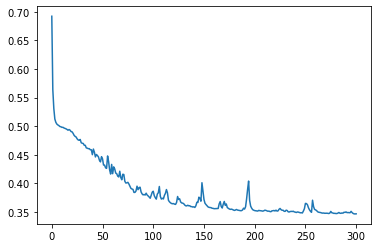

In [462]:
train_loss_ = [train_loss[i].item() for i in range(len(train_loss))]

plt.plot(train_loss_)

In [185]:
train_loss = train(model, dataloaders, loss_fn, opt, acc_metric, epochs)

Epoch 0/200
----------
Current step: 10  Loss: 0.8129570484161377  
Current step: 10  Loss: 0.8129570484161377  Acc: 0.2673788368701935 
Current step: 20  Loss: 0.9037434458732605  
Current step: 20  Loss: 0.9037434458732605  Acc: 0.34211575984954834 
Current step: 30  Loss: 0.8068686723709106  
Current step: 30  Loss: 0.8068686723709106  Acc: 0.4740513265132904 
Loss: 0.8220 Acc: 0.38504359126091003
Saving Model0.torch
Epoch 1/200
----------
Current step: 10  Loss: 0.7929221391677856  
Current step: 10  Loss: 0.7929221391677856  Acc: 0.6101722121238708 
Current step: 20  Loss: 0.8995311856269836  
Current step: 20  Loss: 0.8995311856269836  Acc: 0.4151785671710968 
Current step: 30  Loss: 0.7969440221786499  
Current step: 30  Loss: 0.7969440221786499  Acc: 0.31951531767845154 
Loss: 0.8088 Acc: 0.4690478444099426
Epoch 2/200
----------
Current step: 10  Loss: 0.7753044366836548  
Current step: 10  Loss: 0.7753044366836548  Acc: 0.6031967401504517 
Current step: 20  Loss: 0.8946510553

Current step: 20  Loss: 0.8398476839065552  
Current step: 20  Loss: 0.8398476839065552  Acc: 0.6138791441917419 
Current step: 30  Loss: 0.7324098944664001  
Current step: 30  Loss: 0.7324098944664001  Acc: 0.1266741007566452 
Loss: 0.7048 Acc: 0.530519962310791
Saving Model20.torch
Epoch 21/200
----------
Current step: 10  Loss: 0.5840107202529907  
Current step: 10  Loss: 0.5840107202529907  Acc: 0.8731664419174194 
Current step: 20  Loss: 0.8367207050323486  
Current step: 20  Loss: 0.8367207050323486  Acc: 0.6571269035339355 
Current step: 30  Loss: 0.7266753315925598  
Current step: 30  Loss: 0.7266753315925598  Acc: 0.12587691843509674 
Loss: 0.7013 Acc: 0.5345320701599121
Epoch 22/200
----------
Current step: 10  Loss: 0.5736222267150879  
Current step: 10  Loss: 0.5736222267150879  Acc: 0.882413923740387 
Current step: 20  Loss: 0.8371522426605225  
Current step: 20  Loss: 0.8371522426605225  Acc: 0.6420599222183228 
Current step: 30  Loss: 0.7276208400726318  
Current step: 3

Current step: 30  Loss: 0.6012276411056519  
Current step: 30  Loss: 0.6012276411056519  Acc: 0.5560826063156128 
Loss: 0.6162 Acc: 0.6678081750869751
Saving Model40.torch
Epoch 41/200
----------
Current step: 10  Loss: 0.47001171112060547  
Current step: 10  Loss: 0.47001171112060547  Acc: 0.7801737785339355 
Current step: 20  Loss: 0.8435080051422119  
Current step: 20  Loss: 0.8435080051422119  Acc: 0.5108019709587097 
Current step: 30  Loss: 0.5900102853775024  
Current step: 30  Loss: 0.5900102853775024  Acc: 0.6106903553009033 
Loss: 0.6093 Acc: 0.6758798360824585
Epoch 42/200
----------
Current step: 10  Loss: 0.4689309000968933  
Current step: 10  Loss: 0.4689309000968933  Acc: 0.8136559128761292 
Current step: 20  Loss: 0.8413021564483643  
Current step: 20  Loss: 0.8413021564483643  Acc: 0.5145886540412903 
Current step: 30  Loss: 0.5772081017494202  
Current step: 30  Loss: 0.5772081017494202  Acc: 0.6102120280265808 
Loss: 0.6053 Acc: 0.6733235120773315
Epoch 43/200
-------

Loss: 0.5241 Acc: 0.779226541519165
Saving Model60.torch
Epoch 61/200
----------
Current step: 10  Loss: 0.4327784776687622  
Current step: 10  Loss: 0.4327784776687622  Acc: 0.685945451259613 
Current step: 20  Loss: 0.8109405636787415  
Current step: 20  Loss: 0.8109405636787415  Acc: 0.6397480964660645 
Current step: 30  Loss: 0.4503691792488098  
Current step: 30  Loss: 0.4503691792488098  Acc: 0.5734614133834839 
Loss: 0.5160 Acc: 0.7956016659736633
Epoch 62/200
----------
Current step: 10  Loss: 0.4520305395126343  
Current step: 10  Loss: 0.4520305395126343  Acc: 0.659159779548645 
Current step: 20  Loss: 0.81402587890625  
Current step: 20  Loss: 0.81402587890625  Acc: 0.6234056353569031 
Current step: 30  Loss: 0.4379016160964966  
Current step: 30  Loss: 0.4379016160964966  Acc: 0.6281887888908386 
Loss: 0.5098 Acc: 0.8044410347938538
Epoch 63/200
----------
Current step: 10  Loss: 0.4402686357498169  
Current step: 10  Loss: 0.4402686357498169  Acc: 0.6694036722183228 
Curre

Current step: 10  Loss: 0.38947010040283203  
Current step: 10  Loss: 0.38947010040283203  Acc: 0.833585798740387 
Current step: 20  Loss: 0.801220178604126  
Current step: 20  Loss: 0.801220178604126  Acc: 0.6780133843421936 
Current step: 30  Loss: 0.37339770793914795  
Current step: 30  Loss: 0.37339770793914795  Acc: 0.861726701259613 
Loss: 0.4758 Acc: 0.8565198183059692
Epoch 82/200
----------
Current step: 10  Loss: 0.3838176727294922  
Current step: 10  Loss: 0.3838176727294922  Acc: 0.8562260866165161 
Current step: 20  Loss: 0.8005028367042542  
Current step: 20  Loss: 0.8005028367042542  Acc: 0.6824378371238708 
Current step: 30  Loss: 0.36196190118789673  
Current step: 30  Loss: 0.36196190118789673  Acc: 0.8695790767669678 
Loss: 0.4723 Acc: 0.8631038665771484
Epoch 83/200
----------
Current step: 10  Loss: 0.3849998712539673  
Current step: 10  Loss: 0.3849998712539673  Acc: 0.834941029548645 
Current step: 20  Loss: 0.7969706058502197  
Current step: 20  Loss: 0.79697060

Current step: 20  Loss: 0.7911916971206665  
Current step: 20  Loss: 0.7911916971206665  Acc: 0.7283163070678711 
Current step: 30  Loss: 0.3410646319389343  
Current step: 30  Loss: 0.3410646319389343  Acc: 0.8940927982330322 
Loss: 0.4566 Acc: 0.8886708617210388
Epoch 102/200
----------
Current step: 10  Loss: 0.3704081177711487  
Current step: 10  Loss: 0.3704081177711487  Acc: 0.8886319994926453 
Current step: 20  Loss: 0.7907204627990723  
Current step: 20  Loss: 0.7907204627990723  Acc: 0.7349728941917419 
Current step: 30  Loss: 0.33857017755508423  
Current step: 30  Loss: 0.33857017755508423  Acc: 0.8970822691917419 
Loss: 0.4547 Acc: 0.8934392333030701
Epoch 103/200
----------
Current step: 10  Loss: 0.3697904348373413  
Current step: 10  Loss: 0.3697904348373413  Acc: 0.8872767686843872 
Current step: 20  Loss: 0.7938920259475708  
Current step: 20  Loss: 0.7938920259475708  Acc: 0.7193877696990967 
Current step: 30  Loss: 0.341899037361145  
Current step: 30  Loss: 0.341899

Current step: 30  Loss: 0.3110712766647339  
Current step: 30  Loss: 0.3110712766647339  Acc: 0.9274553656578064 
Loss: 0.4406 Acc: 0.9118115305900574
Epoch 122/200
----------
Current step: 10  Loss: 0.3454452157020569  
Current step: 10  Loss: 0.3454452157020569  Acc: 0.9343112111091614 
Current step: 20  Loss: 0.7855507731437683  
Current step: 20  Loss: 0.7855507731437683  Acc: 0.7625557780265808 
Current step: 30  Loss: 0.31154578924179077  
Current step: 30  Loss: 0.31154578924179077  Acc: 0.9225924611091614 
Loss: 0.4389 Acc: 0.9140278697013855
Epoch 123/200
----------
Current step: 10  Loss: 0.34670257568359375  
Current step: 10  Loss: 0.34670257568359375  Acc: 0.9360650777816772 
Current step: 20  Loss: 0.7842589020729065  
Current step: 20  Loss: 0.7842589020729065  Acc: 0.771085798740387 
Current step: 30  Loss: 0.31510502099990845  
Current step: 30  Loss: 0.31510502099990845  Acc: 0.9271763563156128 
Loss: 0.4398 Acc: 0.915610671043396
Epoch 124/200
----------
Current step

Loss: 0.4425 Acc: 0.9081297516822815
Epoch 142/200
----------
Current step: 10  Loss: 0.34219062328338623  
Current step: 10  Loss: 0.34219062328338623  Acc: 0.940449595451355 
Current step: 20  Loss: 0.8013315200805664  
Current step: 20  Loss: 0.8013315200805664  Acc: 0.6694435477256775 
Current step: 30  Loss: 0.2991214394569397  
Current step: 30  Loss: 0.2991214394569397  Acc: 0.9232302308082581 
Loss: 0.4390 Acc: 0.9110038876533508
Epoch 143/200
----------
Current step: 10  Loss: 0.34511858224868774  
Current step: 10  Loss: 0.34511858224868774  Acc: 0.9412069320678711 
Current step: 20  Loss: 0.7852643728256226  
Current step: 20  Loss: 0.7852643728256226  Acc: 0.7592076063156128 
Current step: 30  Loss: 0.3059319853782654  
Current step: 30  Loss: 0.3059319853782654  Acc: 0.9329161643981934 
Loss: 0.4380 Acc: 0.9139700531959534
Epoch 144/200
----------
Current step: 10  Loss: 0.3468385934829712  
Current step: 10  Loss: 0.3468385934829712  Acc: 0.9356265664100647 
Current step:

Current step: 10  Loss: 0.3437577486038208  
Current step: 10  Loss: 0.3437577486038208  Acc: 0.9153380393981934 
Current step: 20  Loss: 0.7825314998626709  
Current step: 20  Loss: 0.7825314998626709  Acc: 0.7761479616165161 
Current step: 30  Loss: 0.30247366428375244  
Current step: 30  Loss: 0.30247366428375244  Acc: 0.9192841053009033 
Loss: 0.4363 Acc: 0.9163775444030762
Epoch 163/200
----------
Current step: 10  Loss: 0.3381032347679138  
Current step: 10  Loss: 0.3381032347679138  Acc: 0.9363839030265808 
Current step: 20  Loss: 0.784777045249939  
Current step: 20  Loss: 0.784777045249939  Acc: 0.7635124325752258 
Current step: 30  Loss: 0.29207462072372437  
Current step: 30  Loss: 0.29207462072372437  Acc: 0.9204798936843872 
Loss: 0.4363 Acc: 0.9141411781311035
Epoch 164/200
----------
Current step: 10  Loss: 0.33752739429473877  
Current step: 10  Loss: 0.33752739429473877  Acc: 0.9381377696990967 
Current step: 20  Loss: 0.783211350440979  
Current step: 20  Loss: 0.7832

Current step: 20  Loss: 0.7748488783836365  
Current step: 20  Loss: 0.7748488783836365  Acc: 0.8268494606018066 
Current step: 30  Loss: 0.2745932936668396  
Current step: 30  Loss: 0.2745932936668396  Acc: 0.9431202411651611 
Loss: 0.4228 Acc: 0.9363629221916199
Epoch 183/200
----------
Current step: 10  Loss: 0.3266833424568176  
Current step: 10  Loss: 0.3266833424568176  Acc: 0.952128529548645 
Current step: 20  Loss: 0.7743546962738037  
Current step: 20  Loss: 0.7743546962738037  Acc: 0.8288424611091614 
Current step: 30  Loss: 0.27504128217697144  
Current step: 30  Loss: 0.27504128217697144  Acc: 0.9517298936843872 
Loss: 0.4228 Acc: 0.9366819262504578
Epoch 184/200
----------
Current step: 10  Loss: 0.32216376066207886  
Current step: 10  Loss: 0.32216376066207886  Acc: 0.9508529901504517 
Current step: 20  Loss: 0.7730526328086853  
Current step: 20  Loss: 0.7730526328086853  Acc: 0.838289201259613 
Current step: 30  Loss: 0.2765389680862427  
Current step: 30  Loss: 0.27653

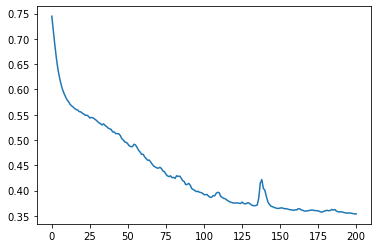

In [122]:
train_loss_ = [train_loss[i].item() for i in range(len(train_loss))]

plt.plot(train_loss_)

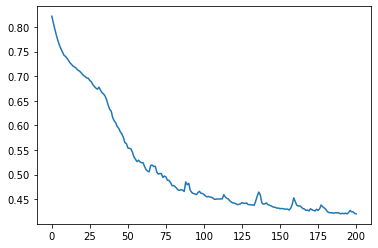

In [187]:
train_loss_ = [train_loss[i].item() for i in range(len(train_loss))]

plt.plot(train_loss_)

In [463]:
path_test_masks = os.path.join(path, 'test', 'mask')
path_test = os.path.join(path, 'test')

names_ = [f[:-25] for f in os.listdir(path_test_masks) if f.endswith('png') and 'sheet' in f]
print(len(names_))
names_.sort()


mask_nod = [ f  for f in os.listdir(path_test_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
names  = [f[:-27] for f in mask_nod ]

mask_nod = [ os.path.join(path_test_masks, f)  for f in os.listdir(path_test_masks) if f.endswith('png') and 'nodular' in f and  f[:-27] in names_ ]
mask_sh = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'sheet' in f  and  f[:-25] in names ]
#mask_bck = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'ale._nonbck' in f  and f[:-22] in names]
#mask_bck = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if f.endswith('png') and 'nonbck' in f  and f[:-22] in names]

image_Paths  = [os.path.join(path_test_masks, f) for f in os.listdir(path_test_masks) if (f.endswith('grayscale.png') or f.endswith('greyscale.png') )  and f[:-14] in names]
print(len(mask_nod), len(mask_sh), len(image_Paths))
#print(len(mask_nod), len(mask_sh), len(mask_bck), len(image_Paths))
mask_nod.sort()
mask_sh.sort()
#mask_bck.sort()
image_Paths.sort()

#mask_Paths  = [[nod, sh, bck]  for nod, sh, bck in zip(mask_nod,mask_sh,mask_bck) ]
mask_Paths_test  = [[nod, sh]  for nod, sh in zip(mask_nod,mask_sh) ]

10
9 9 9


In [464]:
error = 20
Area = 100
image_list = []
mask_list = []

for idx in range(len(mask_Paths_test)):
    #print(idx)
    mask =  create_binary_mask(mask_Paths_test, idx)
    image = read_image(image_Paths[idx], False )
    masks_imgs, imgs = box_image_seg(mask, image, error, Area)
    image_list += imgs
    mask_list += masks_imgs
print('Images and masks are created')
print(len(image_list), len(mask_list))     

Images and masks are created
22 22


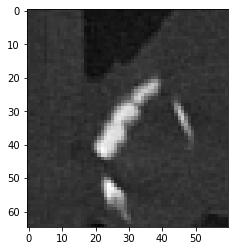

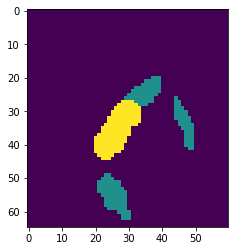

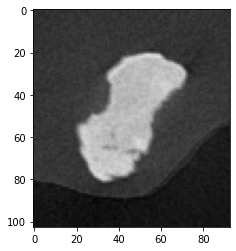

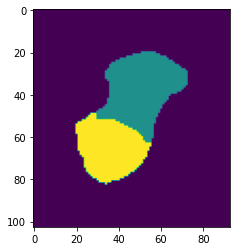

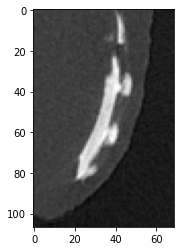

...

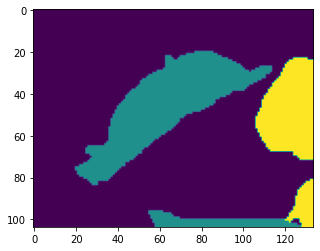

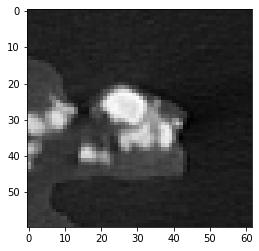

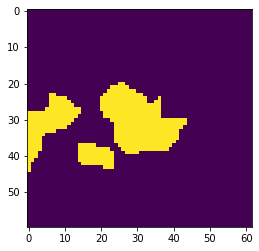

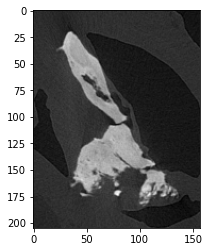

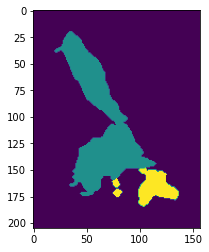

In [382]:
for img, mask in zip(image_list, mask_list):
    plt.imshow(img)
    plt.show()
    plt.imshow(mask)
    plt.show()

In [383]:
modelPath

'C:\\Users\\kmorales\\Desktop\\2DO PhD\\Strasbourg\\Hugo_seg\\model2'

In [433]:
expand = nn.Sequential(torch.nn.Conv2d(in_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.Conv2d(out_channels, out_channels, kernel_size, stride=1, padding=padding),
                            torch.nn.BatchNorm2d(out_channels),
                            torch.nn.ReLU(),
                            torch.nn.ConvTranspose2d(out_channels, out_channels, kernel_size=3, stride=2, padding=1, output_padding=1) 
                            )
#summary(contract_block(3, 8, 7, 3), (3,112,112))
#summary(contract_block(8, 32, 3, 1), (8,56,56))
#summary(contract_block(32, 64, 3, 1), (32,28,28))
#summary(contract_block(64, 128, 3, 1), (64,14,14))
in_channels, out_channels, kernel_size , padding = (128, 64, 3, 1)
summary(expand, (128, 7, 7))
#(64, 14, 14)

# in_channels, out_channels, kernel_size , padding = (64*2, 32, 3, 1)
# summary(expand, (128, 7, 7))

# in_channels, out_channels, kernel_size , padding = (32*2, 8, 3, 1)
# summary(expand, (128, 7, 7))

# in_channels, out_channels, kernel_size , padding = (8*2, 3, 3, 1)
# summary(expand, (128, 7, 7))


Layer (type:depth-idx)                   Output Shape              Param #
├─Conv2d: 1-1                            [-1, 64, 7, 7]            73,792
├─BatchNorm2d: 1-2                       [-1, 64, 7, 7]            128
├─ReLU: 1-3                              [-1, 64, 7, 7]            --
├─Conv2d: 1-4                            [-1, 64, 7, 7]            36,928
├─BatchNorm2d: 1-5                       [-1, 64, 7, 7]            128
├─ReLU: 1-6                              [-1, 64, 7, 7]            --
├─ConvTranspose2d: 1-7                   [-1, 64, 14, 14]          36,928
Total params: 147,904
Trainable params: 147,904
Non-trainable params: 0
Total mult-adds (M): 12.64
Input size (MB): 0.02
Forward/backward pass size (MB): 0.19
Params size (MB): 0.56
Estimated Total Size (MB): 0.78


Layer (type:depth-idx)                   Output Shape              Param #
├─Conv2d: 1-1                            [-1, 64, 7, 7]            73,792
├─BatchNorm2d: 1-2                       [-1, 64, 7, 7]            128
├─ReLU: 1-3                              [-1, 64, 7, 7]            --
├─Conv2d: 1-4                            [-1, 64, 7, 7]            36,928
├─BatchNorm2d: 1-5                       [-1, 64, 7, 7]            128
├─ReLU: 1-6                              [-1, 64, 7, 7]            --
├─ConvTranspose2d: 1-7                   [-1, 64, 14, 14]          36,928
Total params: 147,904
Trainable params: 147,904
Non-trainable params: 0
Total mult-adds (M): 12.64
Input size (MB): 0.02
Forward/backward pass size (MB): 0.19
Params size (MB): 0.56
Estimated Total Size (MB): 0.78

In [435]:
model = UNET(in_channels = 3, out_channels = 3).to(device)

summary(model, (3,512,512))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 8, 256, 256]         --
|    └─Conv2d: 2-1                       [-1, 8, 512, 512]         1,184
|    └─BatchNorm2d: 2-2                  [-1, 8, 512, 512]         16
|    └─ReLU: 2-3                         [-1, 8, 512, 512]         --
|    └─Conv2d: 2-4                       [-1, 8, 512, 512]         3,144
|    └─BatchNorm2d: 2-5                  [-1, 8, 512, 512]         16
|    └─ReLU: 2-6                         [-1, 8, 512, 512]         --
|    └─MaxPool2d: 2-7                    [-1, 8, 256, 256]         --
├─Sequential: 1-2                        [-1, 32, 128, 128]        --
|    └─Conv2d: 2-8                       [-1, 32, 256, 256]        2,336
|    └─BatchNorm2d: 2-9                  [-1, 32, 256, 256]        64
|    └─ReLU: 2-10                        [-1, 32, 256, 256]        --
|    └─Conv2d: 2-11                      [-1, 32, 256, 256]        9,248
|  

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 8, 256, 256]         --
|    └─Conv2d: 2-1                       [-1, 8, 512, 512]         1,184
|    └─BatchNorm2d: 2-2                  [-1, 8, 512, 512]         16
|    └─ReLU: 2-3                         [-1, 8, 512, 512]         --
|    └─Conv2d: 2-4                       [-1, 8, 512, 512]         3,144
|    └─BatchNorm2d: 2-5                  [-1, 8, 512, 512]         16
|    └─ReLU: 2-6                         [-1, 8, 512, 512]         --
|    └─MaxPool2d: 2-7                    [-1, 8, 256, 256]         --
├─Sequential: 1-2                        [-1, 32, 128, 128]        --
|    └─Conv2d: 2-8                       [-1, 32, 256, 256]        2,336
|    └─BatchNorm2d: 2-9                  [-1, 32, 256, 256]        64
|    └─ReLU: 2-10                        [-1, 32, 256, 256]        --
|    └─Conv2d: 2-11                      [-1, 32, 256, 256]        9,248
|  

In [437]:
model = UNET(in_channels = 3, out_channels = 3).to(device)

summary(model, (3, 112, 112))

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 8, 56, 56]           --
|    └─Conv2d: 2-1                       [-1, 8, 112, 112]         1,184
|    └─BatchNorm2d: 2-2                  [-1, 8, 112, 112]         16
|    └─ReLU: 2-3                         [-1, 8, 112, 112]         --
|    └─Conv2d: 2-4                       [-1, 8, 112, 112]         3,144
|    └─BatchNorm2d: 2-5                  [-1, 8, 112, 112]         16
|    └─ReLU: 2-6                         [-1, 8, 112, 112]         --
|    └─MaxPool2d: 2-7                    [-1, 8, 56, 56]           --
├─Sequential: 1-2                        [-1, 32, 28, 28]          --
|    └─Conv2d: 2-8                       [-1, 32, 56, 56]          2,336
|    └─BatchNorm2d: 2-9                  [-1, 32, 56, 56]          64
|    └─ReLU: 2-10                        [-1, 32, 56, 56]          --
|    └─Conv2d: 2-11                      [-1, 32, 56, 56]          9,248
|  

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 8, 56, 56]           --
|    └─Conv2d: 2-1                       [-1, 8, 112, 112]         1,184
|    └─BatchNorm2d: 2-2                  [-1, 8, 112, 112]         16
|    └─ReLU: 2-3                         [-1, 8, 112, 112]         --
|    └─Conv2d: 2-4                       [-1, 8, 112, 112]         3,144
|    └─BatchNorm2d: 2-5                  [-1, 8, 112, 112]         16
|    └─ReLU: 2-6                         [-1, 8, 112, 112]         --
|    └─MaxPool2d: 2-7                    [-1, 8, 56, 56]           --
├─Sequential: 1-2                        [-1, 32, 28, 28]          --
|    └─Conv2d: 2-8                       [-1, 32, 56, 56]          2,336
|    └─BatchNorm2d: 2-9                  [-1, 32, 56, 56]          64
|    └─ReLU: 2-10                        [-1, 32, 56, 56]          --
|    └─Conv2d: 2-11                      [-1, 32, 56, 56]          9,248
|  

In [465]:
model.load_state_dict(torch.load(os.path.join(modelPath , '300.torch'))) # Load trained model
model.eval()

UNET(
  (conv1): Sequential(
    (0): Conv2d(3, 8, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    (1): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(8, 8, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
    (4): BatchNorm2d(8, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (conv2): Sequential(
    (0): Conv2d(8, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  )
  (conv3): Sequential(
    (0): Conv2d(32, 64, kernel_size=

In [466]:
print(len(image_Paths), len(mask_Paths_test))

9 9


tensor(0.5820, grad_fn=<RsubBackward1>)


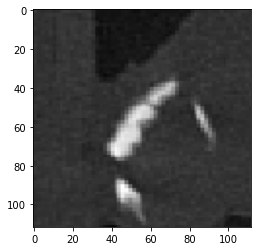

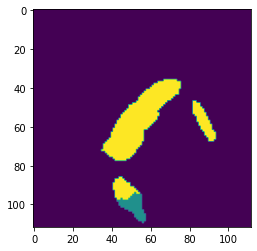

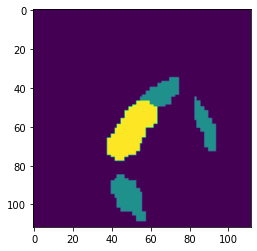

tensor(0.4701, grad_fn=<RsubBackward1>)


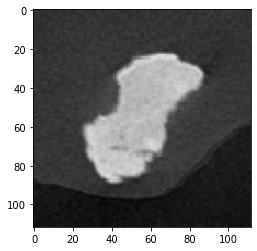

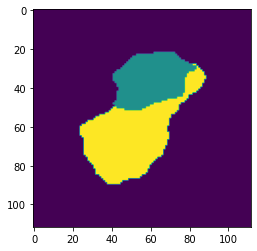

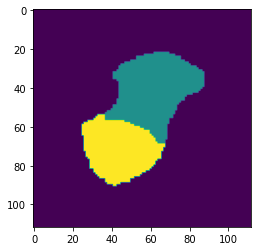

tensor(0.5289, grad_fn=<RsubBackward1>)


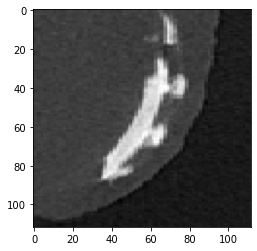

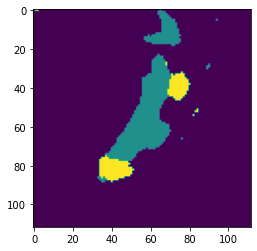

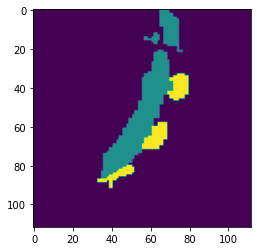

tensor(0.5209, grad_fn=<RsubBackward1>)


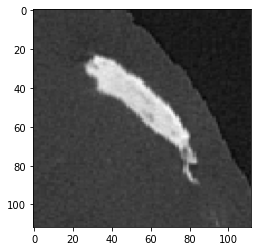

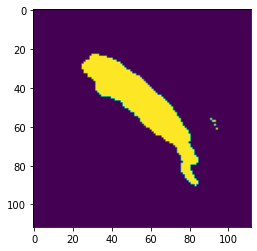

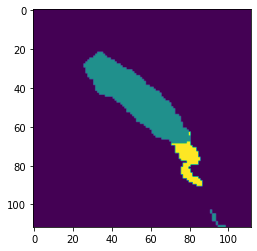

tensor(0.5748, grad_fn=<RsubBackward1>)


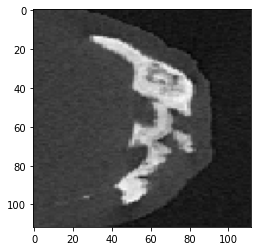

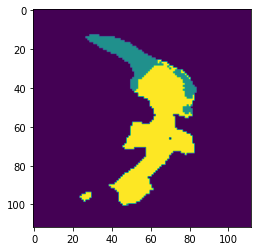

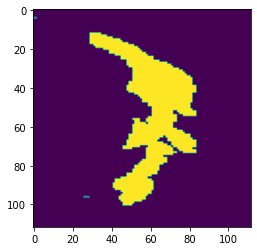

tensor(0.4072, grad_fn=<RsubBackward1>)


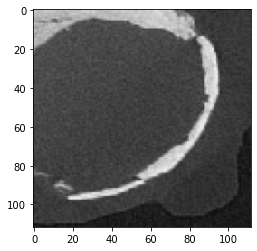

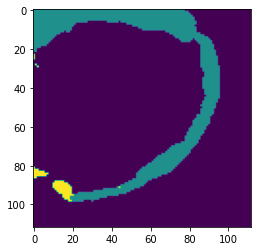

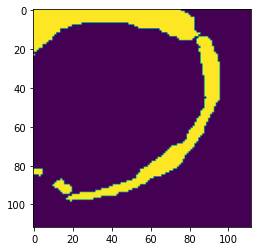

tensor(0.5907, grad_fn=<RsubBackward1>)


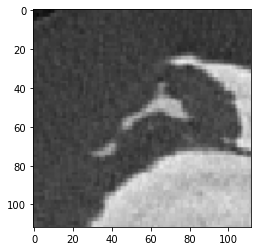

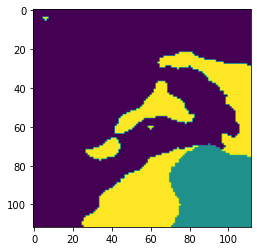

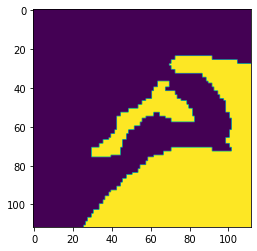

tensor(0.4275, grad_fn=<RsubBackward1>)


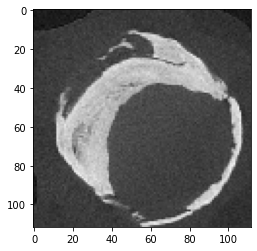

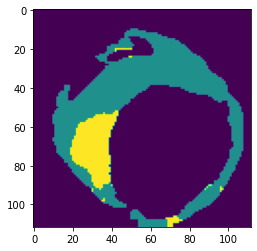

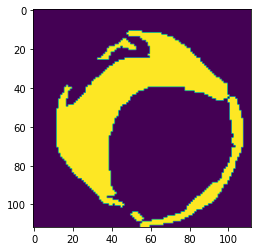

tensor(0.6157, grad_fn=<RsubBackward1>)


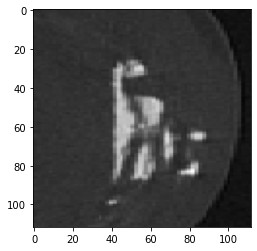

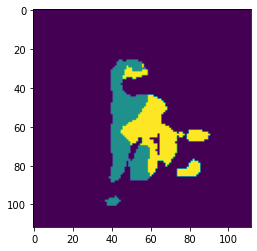

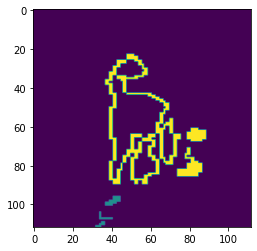

tensor(0.6074, grad_fn=<RsubBackward1>)


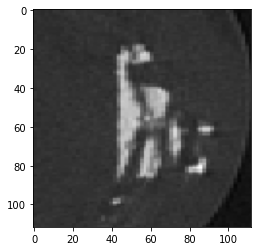

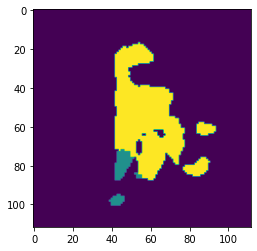

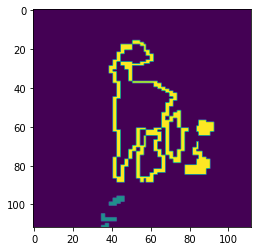

tensor(0.5284, grad_fn=<RsubBackward1>)


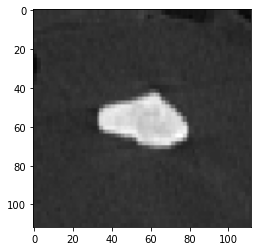

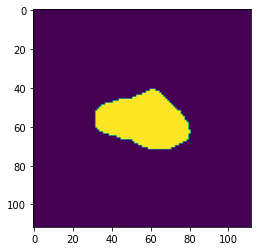

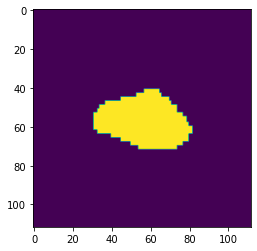

tensor(0.5649, grad_fn=<RsubBackward1>)


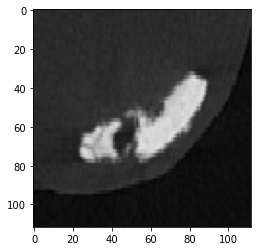

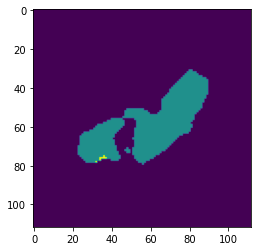

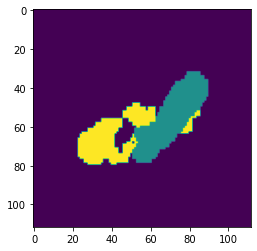

tensor(0.6105, grad_fn=<RsubBackward1>)


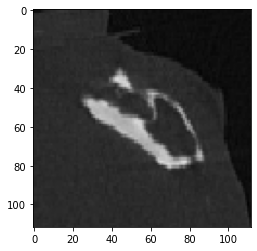

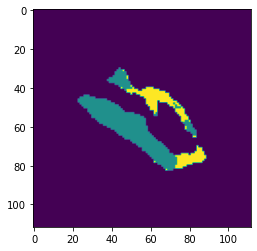

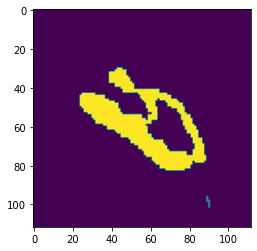

tensor(0.5879, grad_fn=<RsubBackward1>)


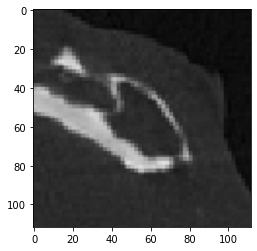

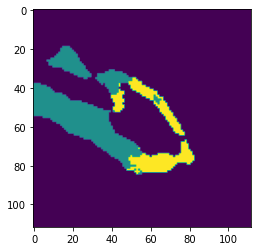

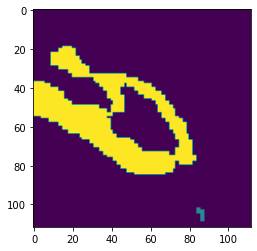

tensor(0.4999, grad_fn=<RsubBackward1>)


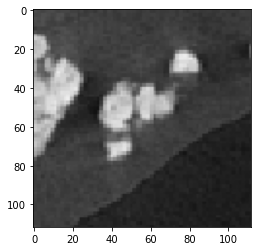

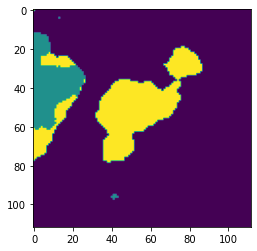

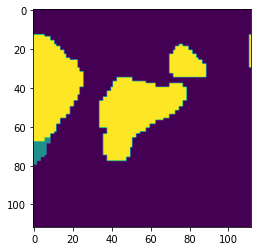

tensor(0.5798, grad_fn=<RsubBackward1>)


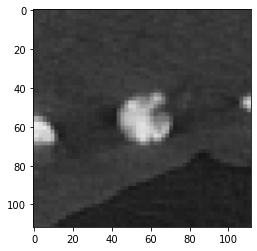

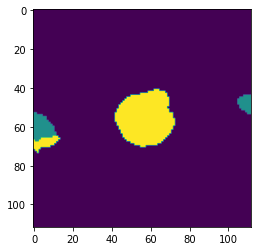

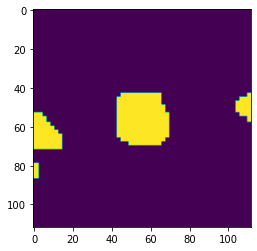

tensor(0.5113, grad_fn=<RsubBackward1>)


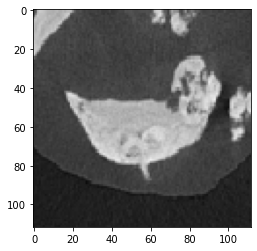

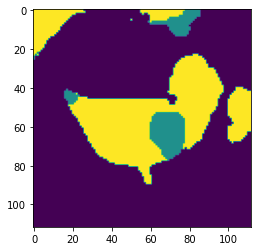

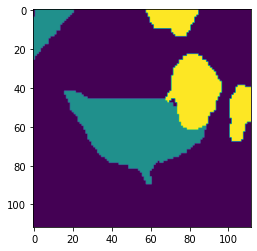

tensor(0.5217, grad_fn=<RsubBackward1>)


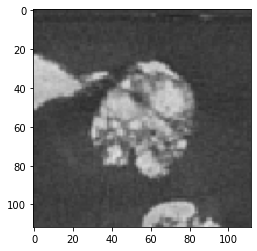

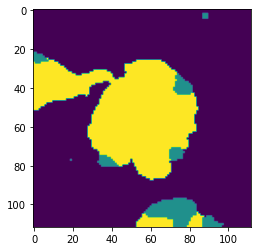

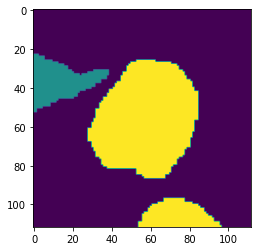

tensor(0.4590, grad_fn=<RsubBackward1>)


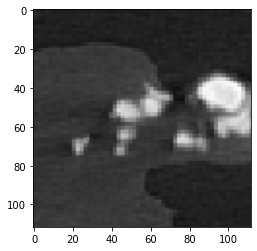

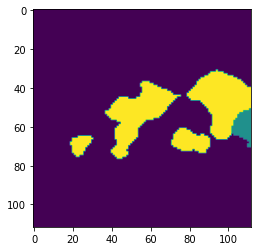

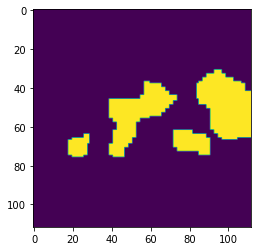

tensor(0.4734, grad_fn=<RsubBackward1>)


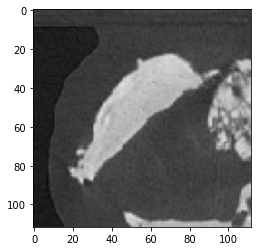

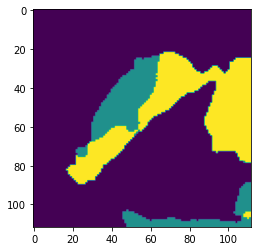

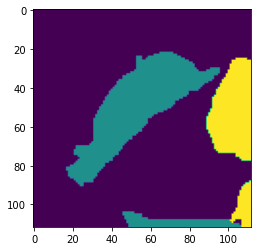

tensor(0.4999, grad_fn=<RsubBackward1>)


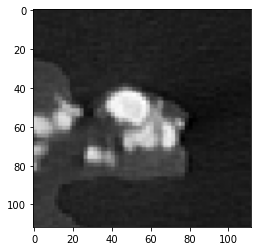

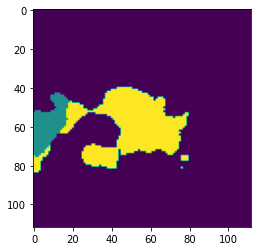

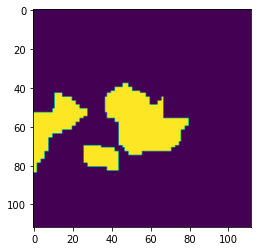

tensor(0.5368, grad_fn=<RsubBackward1>)


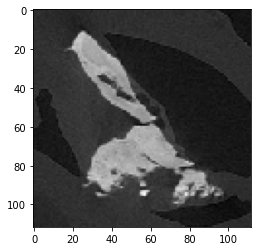

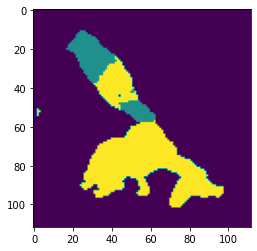

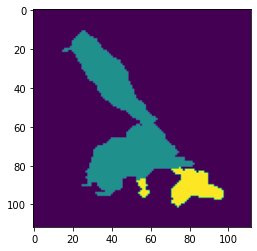

In [467]:
data_test = SegmentationDataset(image_list, mask_list)
dataloaders_test = torch.utils.data.DataLoader(data_test, 1)

for index, batch in enumerate(dataloaders_test): 
    X, y = batch

    X, y = X.to(device), y.to(device)
    pred =  model(X)
    seg = torch.argmax(pred, dim=1).numpy()[0]# torch.argmax(pred, 1).numpy()  # Get  prediction classes
    print(loss_fn(pred, y))
    plt.imshow(X.squeeze().permute(1,2,0))
    plt.show()
    plt.imshow(seg)
    plt.show()
    plt.imshow(y.squeeze())
    plt.show()

In [ ]:
#import copy
model = UNET(in_channels = 3, out_channels = 4).to(device)

modelPath =  r'C:\Users\kmorales\Desktop\2DO PhD\Strasbourg\modelo_1\best_unet_model.pth'
model.load_state_dict(torch.load(modelPath)) # Load trained model
model.eval()


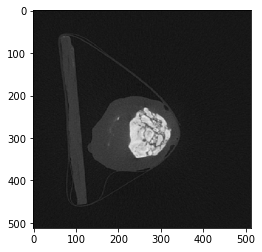

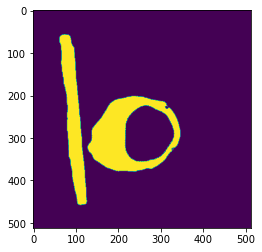

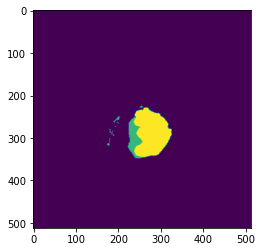

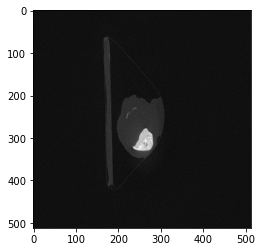

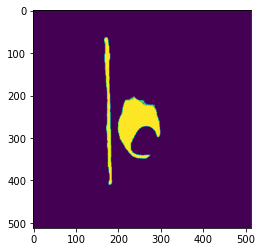

...

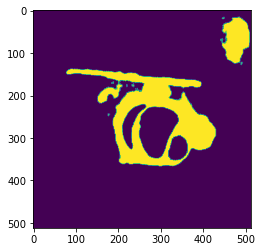

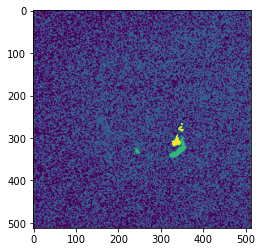

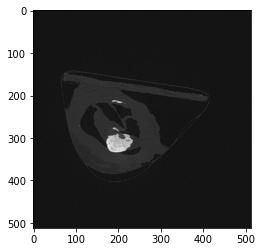

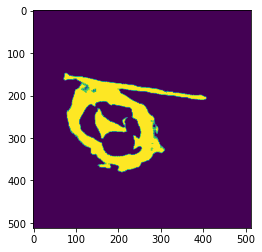

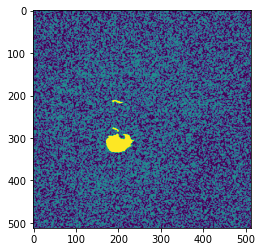

In [552]:
for index, batch in enumerate(dataloaders_test): 

    X, y = batch

    X, y = X.to(device), y.to(device)
    pred =  model(X)
    seg = torch.argmax(pred, dim=1).numpy()[0]# torch.argmax(pred, 1).numpy()  # Get  prediction classes
    plt.imshow(X.squeeze().permute(1,2,0))
    plt.show()
    plt.imshow(seg)
    plt.show()
    plt.imshow(y.squeeze())
    plt.show()